# **Framework for Near-Real Time Sensor-Agnostic Water Classification**

A new image is acquired at T1. Landsat (and potentially Sentinel-2) water masks are aggregated from a period of time T0 (T1-3months). Assuming no significant (TBD) change between T0 and T1 in water extent, it should be possible to identify likely change pixels at the boundary of class distributions if sampled across a representative a large enough area (TBD). Omitting such potential change features enables a significant no. training samples at T1 and these may be used to provide water (+ probability) masks at T1 for all clearsky pixels at T1.

Assumptions
- At least 'somewhat' a complete water mask can be obtained by generating a water summary product for T0
- There is a sufficient area of 'clearsky' within the T1 image
- Class transitions are on a sufficiently limited scale that either
    - (1) they do not need to be omitted and model selection will be robust enough to treat them as outliers, or
    - (2) they can be identified as outliers from the major class distributions using skewness/kurtosis
- 

In [1]:
# Magic + imports likely common across all notebooks
%load_ext autoreload
%autoreload 2
%matplotlib inline
# Supress Warning 
import warnings
warnings.filterwarnings('ignore')
# Set reference for util modules
import sys
sys.path.append('/home/jovyan/odc-hub/')
# Generic python
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr 
from datetime import datetime
from datetime import timedelta
import pandas as pd
import geopandas as gpd
from shapely import wkt

# sac-specific
from sac_utils.createAOI import create_lat_lon

# dc-specific
from datacube import Datacube
from datacube.storage.masking import mask_invalid_data
dc = Datacube()

# ml stuff
from sklearn.ensemble import RandomForestClassifier

import utils_dcal.data_cube_utilities.data_access_api as dc_api
api = dc_api.DataAccessApi()

# dask stuff
import dask.array
import dask
from dask.distributed import Client
client = Client('dask-scheduler.dask.svc.cluster.local:8786')
client

Client Scheduler: tcp://dask-scheduler.dask.svc.cluster.local:8786 Dashboard: http://dask-scheduler.dask.svc.cluster.local:8787/status,Cluster Workers: 5 Cores: 40 Memory: 168.65 GB


# **(0) Set consistent params**

overall aoi and search criteria to assertain datasets across which to run app

In [23]:
viti_levu = "POLYGON((177.47747109686992 -17.376103328077992,178.74364541327617 -17.376103328077992,178.74364541327617 -18.317280451285484,177.47747109686992 -18.317280451285484,177.47747109686992 -17.376103328077992))"
suva = "POLYGON((178.38384316718242 -18.090287234637962,178.49645303046367 -18.090287234637962,178.49645303046367 -18.181641888359497,178.38384316718242 -18.181641888359497,178.38384316718242 -18.090287234637962))"
left = "POLYGON((177.38533176312444 -17.934057815678187,177.52815402874944 -17.934057815678187,177.52815402874944 -18.069888303633736,177.38533176312444 -18.069888303633736,177.38533176312444 -17.934057815678187))"
overall_aoi_wkt = left
overall_aoi_gdf = pd.DataFrame({'geometry':[overall_aoi_wkt]})
overall_aoi_gdf['geometry'] = overall_aoi_gdf['geometry'].apply(wkt.loads)
overall_aoi_gdf['aoi'] = 'aoi'
overall_aoi_gdf = gpd.GeoDataFrame(overall_aoi_gdf, geometry='geometry', crs={"init": "epsg:4326"}) # using {init} important
latitude, longitude = create_lat_lon(overall_aoi_wkt)

product = "ls8_usgs_sr_scene"
measurements = ["green","red","blue","nir","swir1","swir2", "pixel_qa"]

latitude, longitude

((-18.069888303633736, -17.934057815678187),
 (177.38533176312444, 177.52815402874944))

**find datasets** - *note*: lat lon returns all anti-meridian scenes at that longitude, so need additional filtering here

In [24]:
ds = dc.find_datasets(
    product=product,
    lat=latitude,
    lon=longitude,
#     measurements = measurements,
) 
len(ds), # vars(ds[0])

(682,)

get **ds footprints & dates** - *note*: ds.extent.wkt doesn't play nice so use yml metadata as already in 4326 wkt

,Date,xmin,xmax,ymin,ymax,id,geometry,des
616,2019-09-10 22:07:16,177.450725,179.659034,-19.854228,-17.722108,3c48c73a-e806-5f64-b27f-13e77a585d81,POLYGON ((177.4507250634612 -19.85422847737529...,True
619,2019-09-01 22:13:24,175.912161,178.104072,-19.837941,-17.736649,835d1a69-e884-5559-a0ba-00d2c8a4bea3,POLYGON ((175.9121605343785 -19.83794061456632...,True


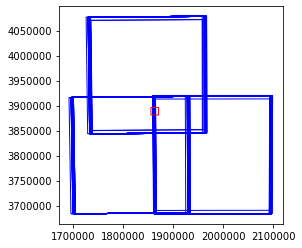

In [25]:
def parsemetaparams(df):
    g = []
    for index, row in df.iterrows():
        g.append(f"Polygon(({row.xmin} {row.ymin}, {row.xmax} {row.ymin}, {row.xmax} {row.ymax}, {row.xmin} {row.ymax}, {row.xmin} {row.ymin}))")
    df['geometry'] = g
    return df
df=pd.DataFrame({
    'Date': [i.metadata.time[0] for i in ds],
    'xmin': [i.metadata.lon[0] for i in ds],
    'xmax': [i.metadata.lon[1] for i in ds],
    'ymin': [i.metadata.lat[0] for i in ds],
    'ymax': [i.metadata.lat[1] for i in ds],
    'id': [i.metadata.id for i in ds],
})
df = parsemetaparams(df)
df['geometry'] = df['geometry'].apply(wkt.loads)
gdf = gpd.GeoDataFrame(df, geometry='geometry', crs=({"init":"epsg:4326"}))
# repro and intersect to omit potemtial am scenes
a = overall_aoi_gdf.to_crs({"init": "epsg:3460"}) # speed intersect up by repro-ing aoi first
gdf['des'] = gdf.to_crs({"init": "epsg:3460"}).geometry.map(lambda x: x.intersects(a.geometry.any())) # repro and test intersect
gdf = gdf[gdf['des']==True] # subset
gdf = gdf.sort_values(by=['Date'], ascending=False)

# check expected footprints etc.
fig, ax = plt.subplots()
gdf.to_crs({"init": "epsg:3460"}).plot(facecolor="",edgecolor="b", ax=ax);
overall_aoi_gdf.to_crs({"init": "epsg:3460"}).plot(facecolor="",edgecolor="r", ax=ax);
gdf.head(2)

In [26]:
# work with just most recent image for now
n = 8

In [27]:
# format acquistion date of image being classified
T = pd.to_datetime(gdf.iloc[[n]].Date.values[0]).date()
# add a day on to satisfy dc.load time range req
T1 = (str(T), str(pd.to_datetime(T +pd.DateOffset(1)).date()))
# create T0 range of 90 days prior to acquisition
T0 = (str(pd.to_datetime(T + pd.DateOffset(-91)).date()), str(pd.to_datetime(T + pd.DateOffset(-1)).date()))
# lat and lon taken from image metadate
latitude, longitude = create_lat_lon(str(gdf.iloc[[n]].geometry.values[0]))
# hopefully fiji crs avoids major AM issues
output_crs = "EPSG:32760"
resolution = (-30,30)
ref_channel = 'red'

T1_prod = "ls8_usgs_sr_scene"
T1_measurements = ["green","red","blue","nir","swir1","swir2", "pixel_qa"]
T1_vars = ['green','red','blue','nir','swir1','swir2']

print(latitude, longitude)
print(T1, T0)
print(ref_channel)

(-18.40007562737095, -16.28960893160902) (176.2452931258123, 178.4182683636611)
('2019-07-31', '2019-08-01') ('2019-05-01', '2019-07-30')
red


# **(1) create T0 water mask (T1-3months)**

**load T0 water masks**

In [28]:
product = 'ls8_water_classification'
measurements = ['water']

water_dataset = dc.load(
    product=product,
    time=T0, # quarter prior to T1 
    lat=latitude,
    lon=longitude,
    output_crs=output_crs,
    resolution=resolution,
    measurements = measurements,
    group_by='solar_day',
    dask_chunks={
        #'time': 1,
        'x': 1000,
        'y': 1000,
    }
)
water_dataset

<xarray.Dataset>
Dimensions:  (time: 28, x: 7740, y: 7803)
Coordinates:
  * time     (time) datetime64[ns] 2019-05-03T22:18:01 ... 2019-07-24T22:06:37
  * y        (y) float64 8.199e+06 8.199e+06 8.199e+06 ... 7.965e+06 7.965e+06
  * x        (x) float64 4.194e+05 4.194e+05 4.194e+05 ... 6.515e+05 6.515e+05
Data variables:
    water    (time, y, x) int16 dask.array<shape=(28, 7803, 7740), chunksize=(1, 1000, 1000)>
Attributes:
    crs:      EPSG:32760

fully **remove nodata** pixels (can't just use ==-9999 due to potential nn averaging within dc.load() at res <native

In [29]:
# Identify pixels with valid data
good_quality = (
    (water_dataset.water >= 0) # no data
)
# Apply mask
water_dataset = water_dataset.where(good_quality)

**define dask computation** of water summary product

In [30]:
mean_dataset = water_dataset.water.mean(dim='time')

**apply computation** to water masks dataset & plot

In [31]:
%%time
mean_dataset = mean_dataset.compute()

CPU times: user 3.2 s, sys: 1.51 s, total: 4.71 s
Wall time: 1min 34s


In [32]:
del water_dataset
client.restart()

Client Scheduler: tcp://dask-scheduler.dask.svc.cluster.local:8786 Dashboard: http://dask-scheduler.dask.svc.cluster.local:8787/status,Cluster Workers: 5 Cores: 40 Memory: 168.65 GB


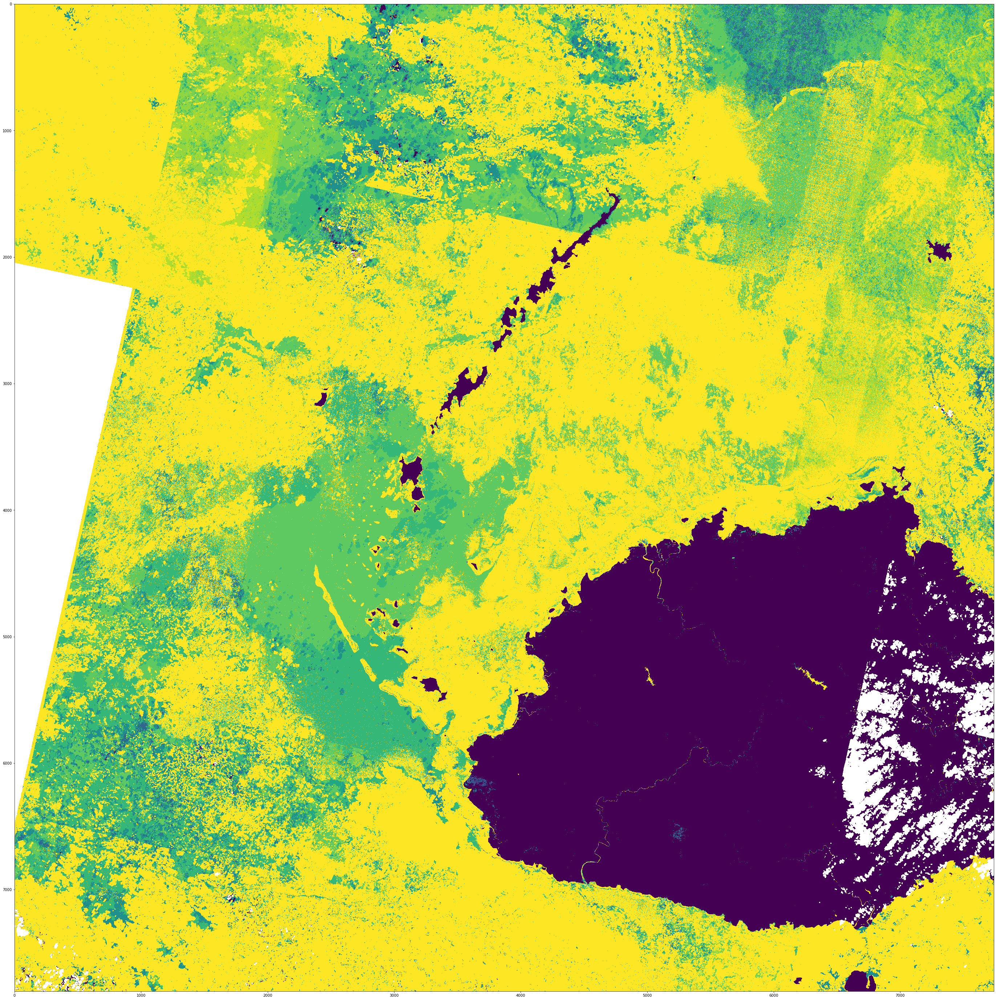

In [33]:
fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(mean_dataset)
# mean_dataset.plot(ax=ax)

**create binary water mask** based on summary product (based off likelihood of being persistent water bodies)

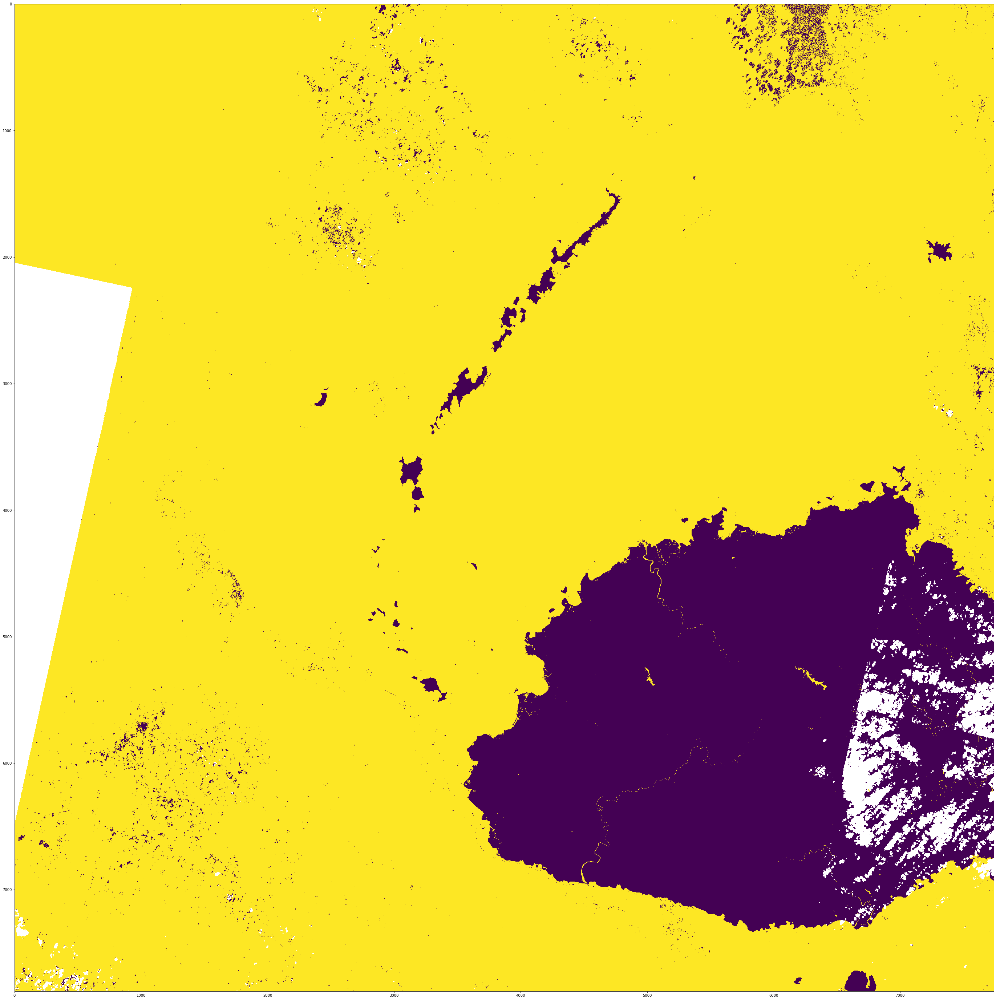

In [34]:
waterpres_prob = 0.5
T0_nd_water = np.isnan(mean_dataset)
T0_water = mean_dataset.where((mean_dataset < waterpres_prob) | (T0_nd_water == True), 1) # fix > prob to water
T0_water = T0_water.where((T0_water >= waterpres_prob) | (T0_nd_water == True), 0) # fix < prob to no water 

fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(T0_water)
# T0_water.plot(ax=ax)

# **(2) load T1 image**

**load** l8

In [40]:
product = T1_prod
measurements = T1_measurements

landsat_dataset = dc.load(
    product=product,
    time=T1, # we know a nice single image is here
    lat=latitude,
    lon=longitude,
    output_crs=output_crs,
    resolution=resolution,
    measurements = measurements,
#     group_by='solar_day',
    dask_chunks={
        #'time': 1,
        'x': 1000,
        'y': 1000,
    }
)
landsat_dataset

<xarray.Dataset>
Dimensions:   (time: 3, x: 7740, y: 7803)
Coordinates:
  * time      (time) datetime64[ns] 2019-07-31T22:12:27 ... 2019-07-31T22:13:15
  * y         (y) float64 8.199e+06 8.199e+06 8.199e+06 ... 7.965e+06 7.965e+06
  * x         (x) float64 4.194e+05 4.194e+05 4.194e+05 ... 6.515e+05 6.515e+05
Data variables:
    green     (time, y, x) int16 dask.array<shape=(3, 7803, 7740), chunksize=(1, 1000, 1000)>
    red       (time, y, x) int16 dask.array<shape=(3, 7803, 7740), chunksize=(1, 1000, 1000)>
    blue      (time, y, x) int16 dask.array<shape=(3, 7803, 7740), chunksize=(1, 1000, 1000)>
    nir       (time, y, x) int16 dask.array<shape=(3, 7803, 7740), chunksize=(1, 1000, 1000)>
    swir1     (time, y, x) int16 dask.array<shape=(3, 7803, 7740), chunksize=(1, 1000, 1000)>
    swir2     (time, y, x) int16 dask.array<shape=(3, 7803, 7740), chunksize=(1, 1000, 1000)>
    pixel_qa  (time, y, x) uint16 dask.array<shape=(3, 7803, 7740), chunksize=(1, 1000, 1000)>
Attributes:
 

apply **clearsky mask** to image

In [41]:
# Identify pixels with valid data
good_quality = (
    (landsat_dataset.pixel_qa == 322)  | # clear
    (landsat_dataset.pixel_qa == 386)  |
    (landsat_dataset.pixel_qa == 834)  |
    (landsat_dataset.pixel_qa == 898)  |
    (landsat_dataset.pixel_qa == 1346) |
    (landsat_dataset.pixel_qa == 324)  | # water
    (landsat_dataset.pixel_qa == 388)  |
    (landsat_dataset.pixel_qa == 836)  |
    (landsat_dataset.pixel_qa == 900)  |
    (landsat_dataset.pixel_qa == 1348)
)
# Apply mask
landsat_dataset = landsat_dataset.where(good_quality)

**isolate image**

In [44]:
T1_img = landsat_dataset.isel(time = 1)

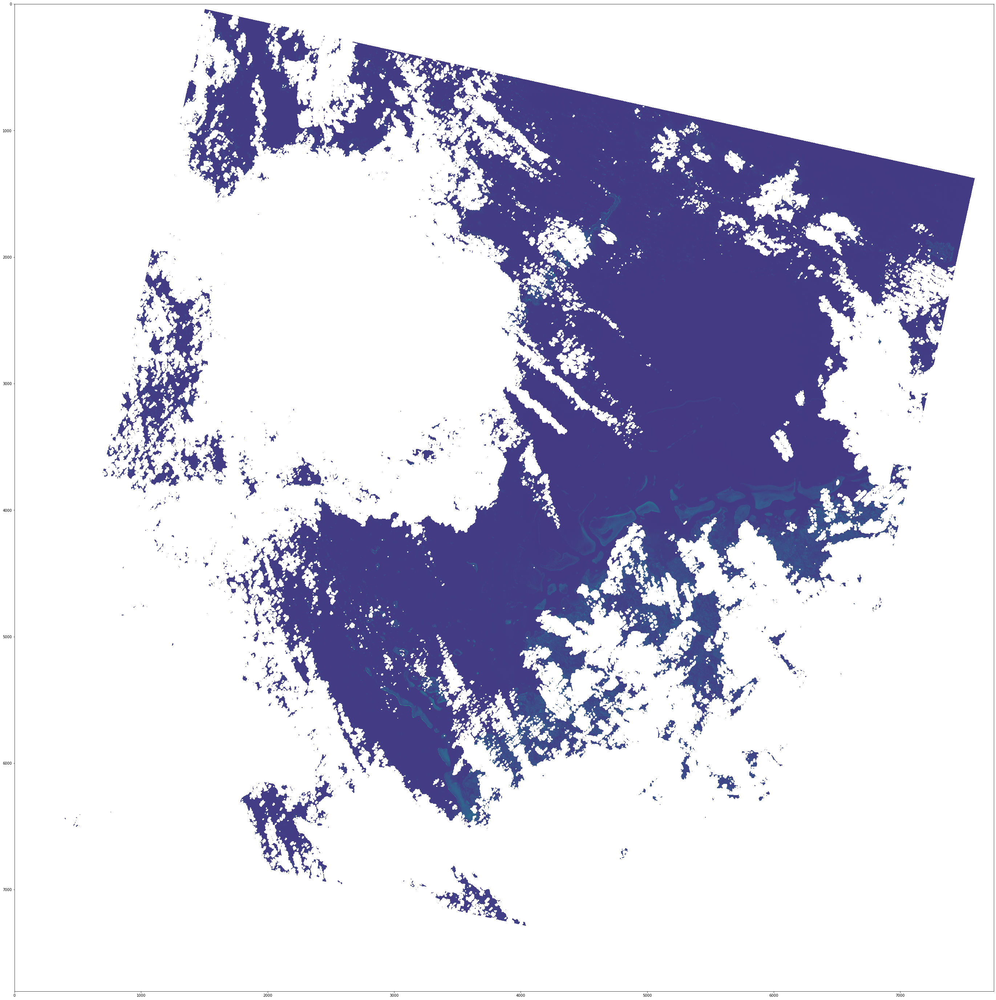

In [45]:
fig, ax = plt.subplots(figsize=(50,50))
# T1_img[ref_channel].plot(ax=ax)
ax.imshow(T1_img[ref_channel])

# **(#) Load T1 Water Mask** for validation

**load T1 water mask** for validation

In [46]:
product = 'ls8_water_classification'
measurements = ['water']

water_dataset = dc.load(
    product=product,
    time=T1, 
    lat=latitude,
    lon=longitude,
    output_crs=output_crs,
    resolution=resolution,
    measurements = measurements,
    group_by='solar_day',
    dask_chunks={
        #'time': 1,
        'x': 1000,
        'y': 1000,
    }
)
water_dataset

<xarray.Dataset>
Dimensions:  (time: 1, x: 7740, y: 7803)
Coordinates:
  * time     (time) datetime64[ns] 2019-07-31T22:12:27
  * y        (y) float64 8.199e+06 8.199e+06 8.199e+06 ... 7.965e+06 7.965e+06
  * x        (x) float64 4.194e+05 4.194e+05 4.194e+05 ... 6.515e+05 6.515e+05
Data variables:
    water    (time, y, x) int16 dask.array<shape=(1, 7803, 7740), chunksize=(1, 1000, 1000)>
Attributes:
    crs:      EPSG:32760

fully remove nodata pixels (can't just use ==-9999 due to potential nn averaging within dc.load() at res <native

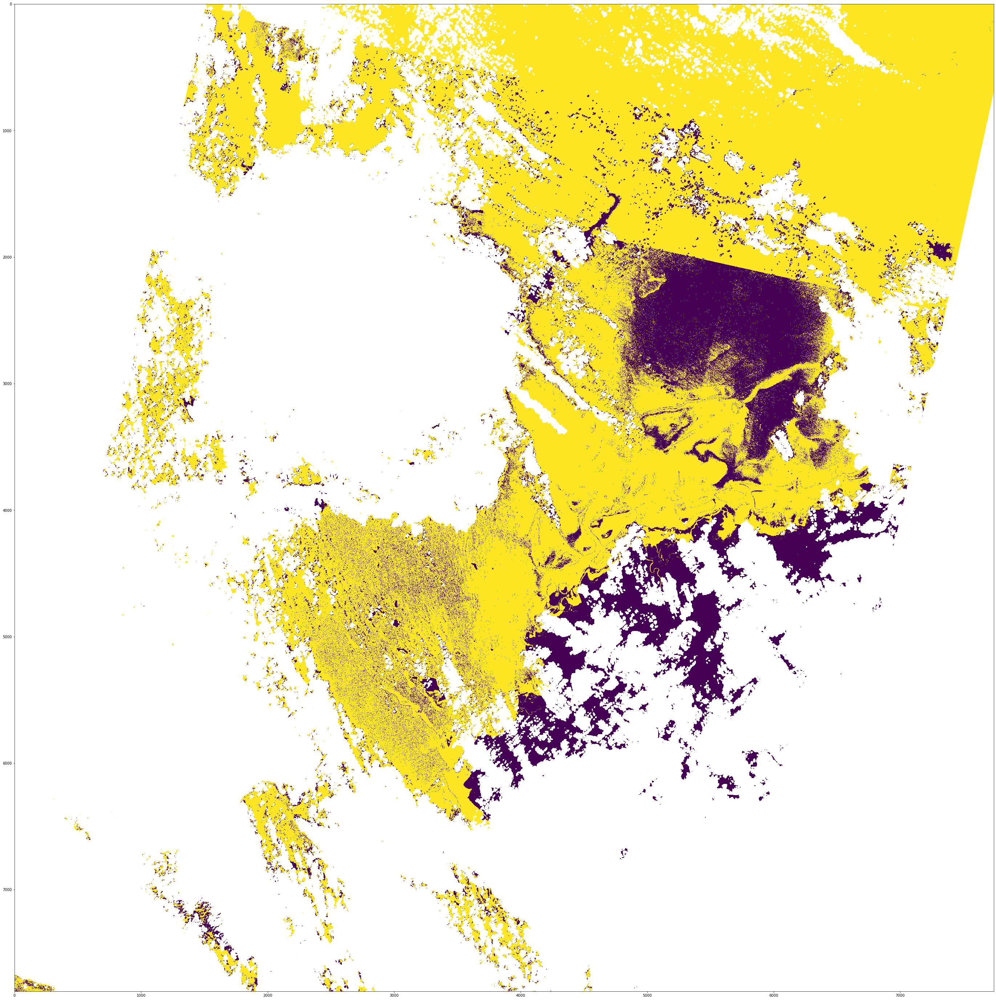

In [48]:
# Identify pixels with valid data
good_quality = (
    (water_dataset.water >= 0) # no data
)
# Apply mask
water_dataset = water_dataset.where(good_quality)

T1_water = water_dataset.isel(time = 0).water
fig, ax = plt.subplots(figsize=(50,50))
# T1_img[ref_channel].plot(ax=ax)
ax.imshow(T1_water)

# **(3) Data fusion prep**

Training (class exploration + training):
- create outside merge nodata mask
- apply outside merge nodata mask
- numpify xr dataset(arrays)
- flatten
- remove nodata (can't be sparse for training)
- transpose

Inference
- [create outside merge, if validating]
- [apply no data mask]
- numpify
- flatten
- [1] remove nodata for accurate validation
- [2] replace nodata to maintain positioning

## (3A) Training prep

**create outside merge of nodata** - T1 img + T0 water mask

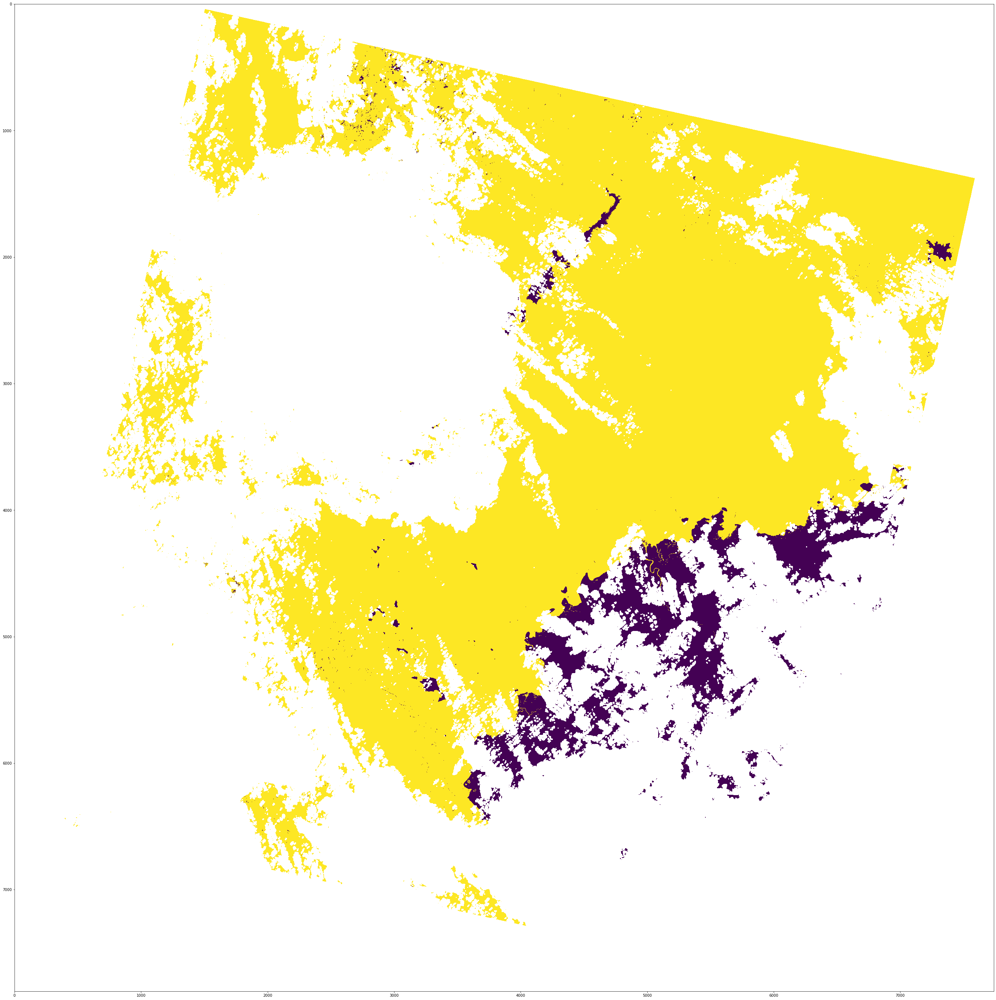

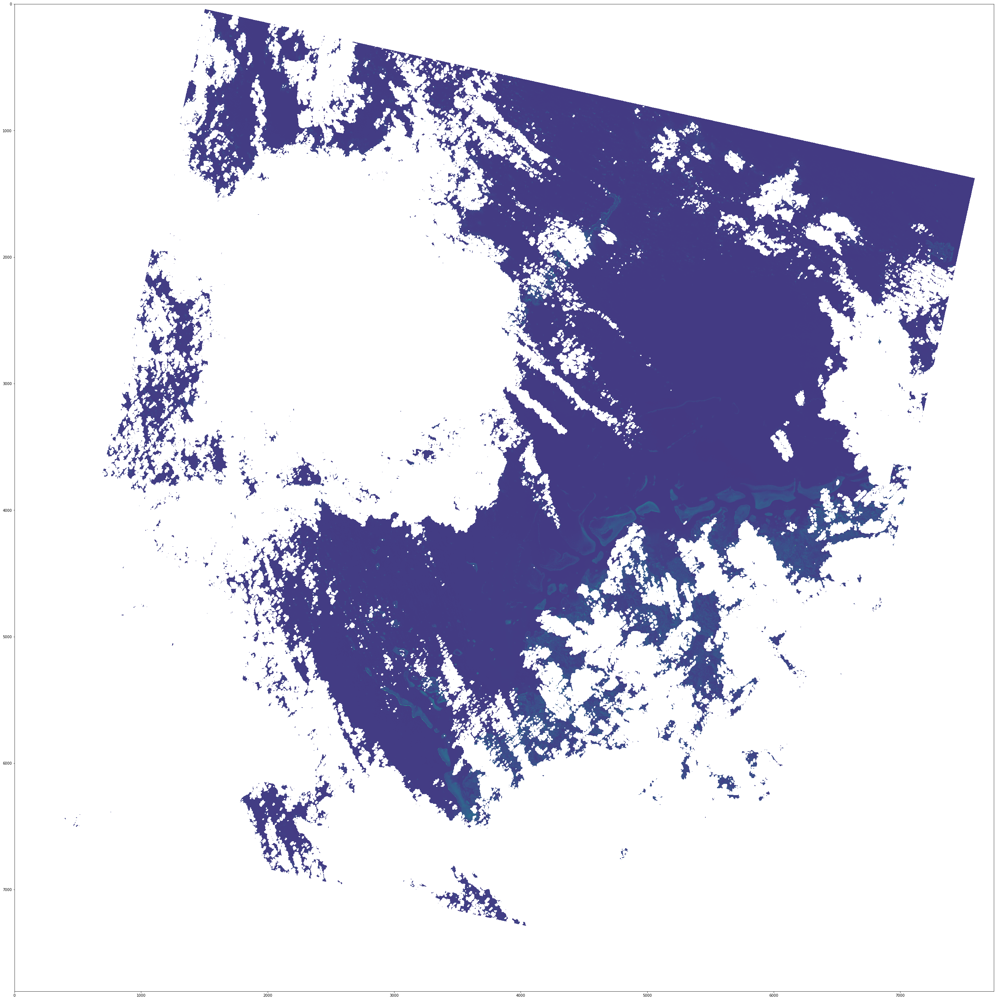

In [50]:
# create mask
T0_nd_img = np.isnan(T1_img)[ref_channel]
T0_nd = T0_nd_water.where((T0_nd_img == False),True)

# apply mask
Ytrain = T0_water.where((T0_nd == False))
Xtrain = T1_img.where((T0_nd == False))

fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(Ytrain)
fig, ax = plt.subplots(figsize=(50,50))
# ax.imshow(Xtrain.where(Xtrain[ref_channel]>0)[ref_channel])
ax.imshow(Xtrain[ref_channel])

**numpify** T1 image data

In [51]:
des_vars = T1_vars

lenx, leny = np.shape(Xtrain[ref_channel]) # dims of each raster
dsvals = np.zeros([len(des_vars),lenx, leny]) #set up array based on shape of xr and no. des bands

for i, m in zip(np.arange(0,len(Xtrain.data_vars),1), Xtrain.variables): # loop through bands in xr
    print(i, m)
    if m in des_vars: # only want relevant channels
        vals = np.array(Xtrain[m].values) # extract only the reflectance values
        dsvals[i,:,:] = vals # append to 'master' ND array
# plt.imshow(dsvals[0,:,:])

0 green
1 red
2 blue
3 nir
4 swir1
5 swir2
6 pixel_qa


**re-shape**/flatten T1 data + T0 labels

In [52]:
Xtrain = dsvals.reshape(dsvals.shape[0], lenx * leny)  # reshape into nbands x 1D arrays
Ytrain = Ytrain.values.flatten()

Xtrain.shape, Ytrain.shape

((6, 60395220), (60395220,))

**remove coincident nd from arrays** variables

In [53]:
Xtrain = np.array([i[~np.isnan(i)] for i in Xtrain])
Ytrain = Ytrain[~np.isnan(Ytrain)]

Xtrain.shape, Ytrain.shape

((6, 16020178), (16020178,))

**transpose** variables

In [54]:
Xtrain = Xtrain.transpose()  # transpose so that bands are read as features

Xtrain.shape, Ytrain.shape

((16020178, 6), (16020178,))

## (3B) Inference Validation Prep

**create outside merge of nodata** - T1 img + T1 water mask

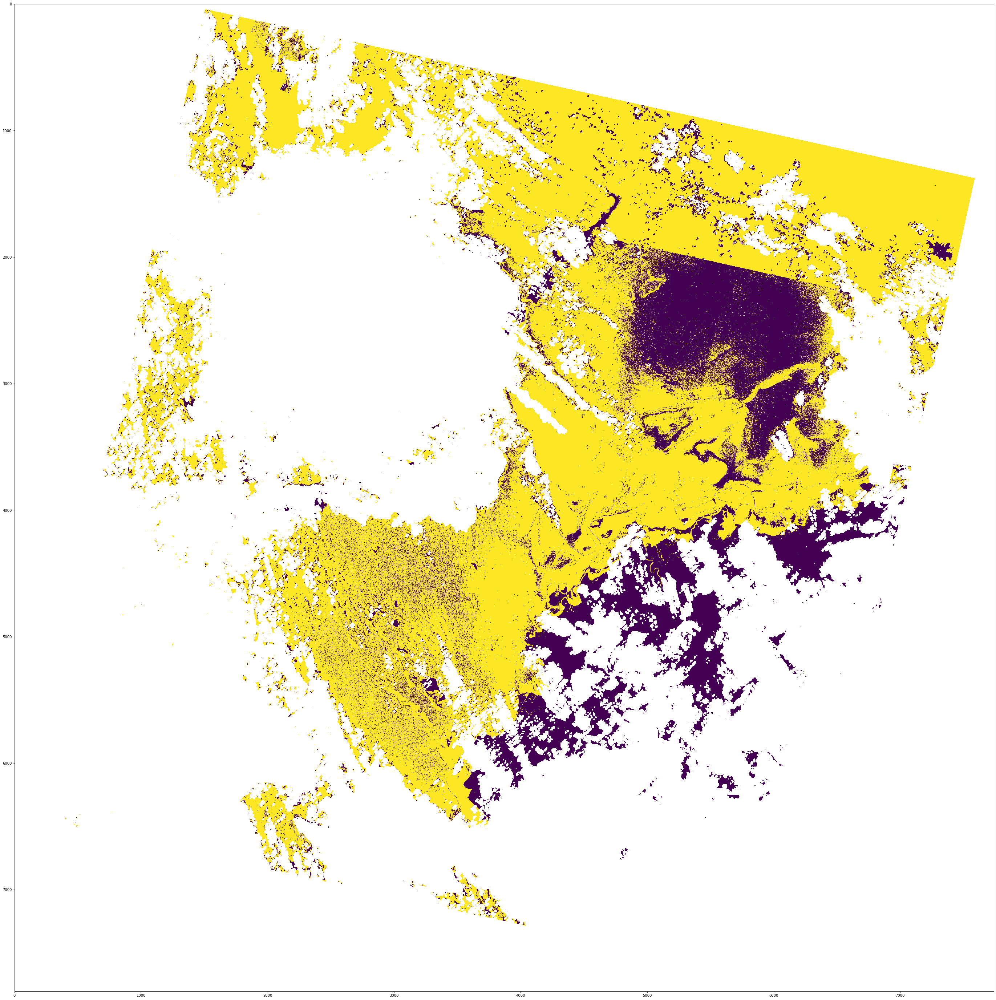

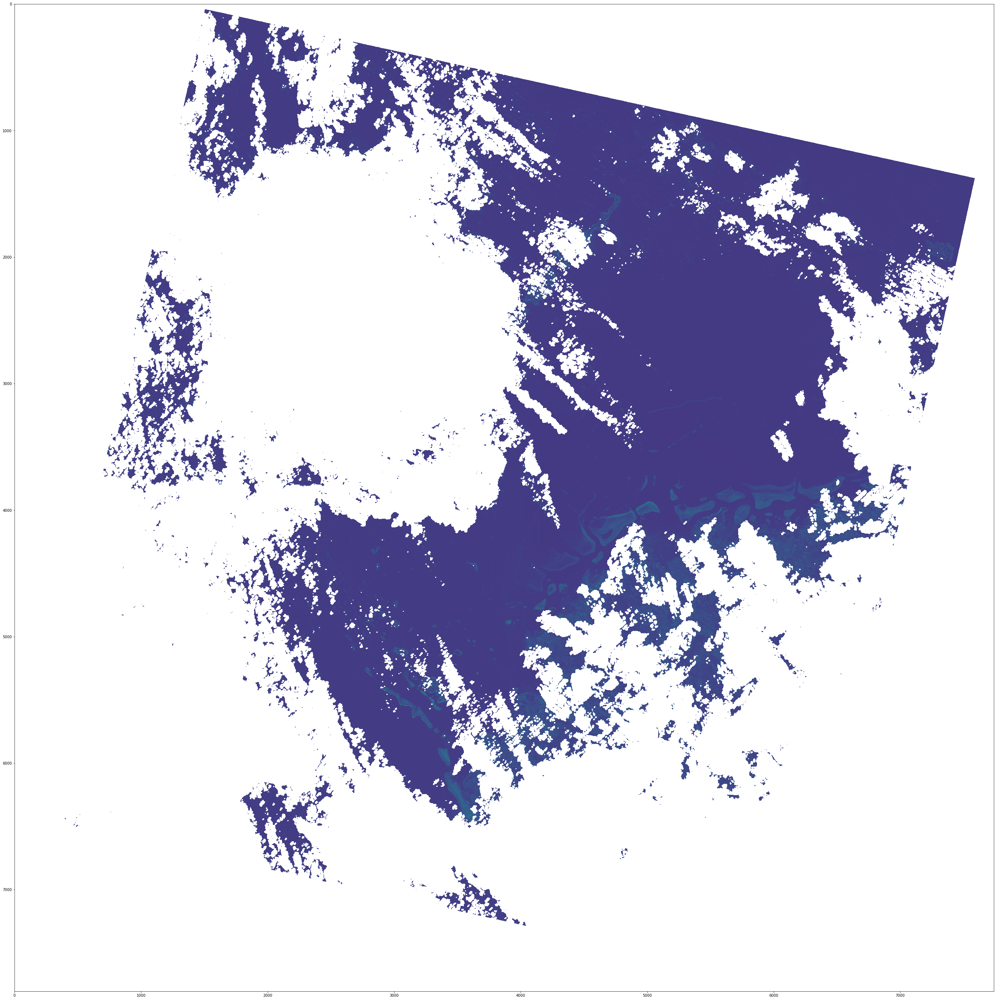

In [55]:
# create
T1_nd_water = np.isnan(T1_water)
T1_img_nd = np.isnan(T1_img)[ref_channel]
T1_merge_nd = T1_nd_water.where((T1_img_nd == False),True)
# apply
Yval = T1_water.where((T1_merge_nd == False))
Xval = T1_img.where((T1_merge_nd == False))

fig, ax = plt.subplots(figsize=(50,50))
# Yval.plot(ax=ax)
ax.imshow(Yval)
fig, ax = plt.subplots(figsize=(50,50))
# Xval.where(Xval[ref_channel]>0)[ref_channel].plot(ax=ax)
ax.imshow(Xval[ref_channel])

**numpify** T1 image data - within merge

In [56]:
des_vars = T1_vars

lenx, leny = np.shape(Xval[ref_channel]) # dims of each raster
dsvals = np.zeros([len(des_vars),lenx, leny]) #set up array based on shape of xr and no. des bands

for i, m in zip(np.arange(0,len(Xval.data_vars),1), Xval.variables): # loop through bands in xr
    print(i, m)
    if m in des_vars: # only want relevant channels
        vals = np.array(Xval[m].values) # extract only the reflectance values
        dsvals[i,:,:] = vals # append to 'master' ND array
# plt.imshow(dsvals[0,:,:])

0 green
1 red
2 blue
3 nir
4 swir1
5 swir2
6 pixel_qa


**re-shape**/flatten T1 data + T1 labels

In [57]:
Xval = dsvals.reshape(dsvals.shape[0], lenx * leny)  # reshape into nbands x 1D arrays
Yval = Yval.values.flatten()

Xval.shape, Yval.shape

((6, 60395220), (60395220,))

**remove coincident nd from arrays** variables

In [58]:
Xval = np.array([i[~np.isnan(i)] for i in Xval])
Yval = Yval[~np.isnan(Yval)]

Xval.shape, Yval.shape

((6, 15939753), (15939753,))

**transpose** variables

In [59]:
Xval = Xval.transpose()  # transpose so that bands are read as features

Xval.shape, Yval.shape

((15939753, 6), (15939753,))

## (3C) Inference Implementation Prep

**numpify** T1 image data - within merge

In [60]:
des_vars = ['green','red','blue','nir','swir1','swir2']

lenx, leny = np.shape(T1_img[ref_channel]) # dims of each raster
dsvals = np.zeros([len(des_vars),lenx, leny]) #set up array based on shape of xr and no. des bands

for i, m in zip(np.arange(0,len(T1_img.data_vars),1), T1_img.variables): # loop through bands in xr
    print(i, m)
    if m in des_vars: # only want relevant channels
        vals = np.array(T1_img[m].values) # extract only the reflectance values
        dsvals[i,:,:] = vals # append to 'master' ND array
# plt.imshow(dsvals[0,:,:])

0 green
1 red
2 blue
3 nir
4 swir1
5 swir2
6 pixel_qa


**re-shape**/flatten T1 data + T1 labels

In [61]:
Ximp = dsvals.reshape(dsvals.shape[0], lenx * leny)  # reshape into nbands x 1D arrays

Ximp.shape

(6, 60395220)

**replace coincident nd from arrays** variables

**transpose** variables

In [62]:
Ximp = Ximp.transpose()  # transpose so that bands are read as features

Ximp.shape

(60395220, 6)

In [81]:
foundnans = np.isnan(Ximp)
Ximp[foundnans] = 0

# **(4) Class Exploration**

**separate class vars**

In [64]:
X, Y = Xtrain, Ytrain
X, X.shape, Y,Y.shape

x_t = [X[:, i][Y==1] for i in range(X.shape[1])]
x_f = [X[:, i][Y==0] for i in range(X.shape[1])]
# x_t, x_f

**plot native class distributions in available vars**

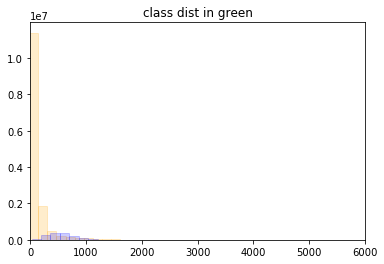

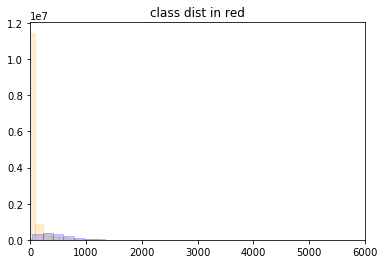

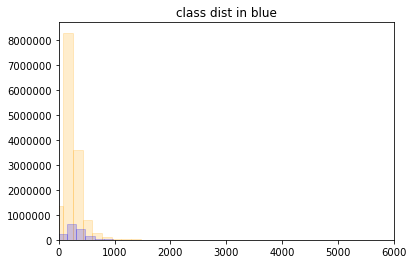

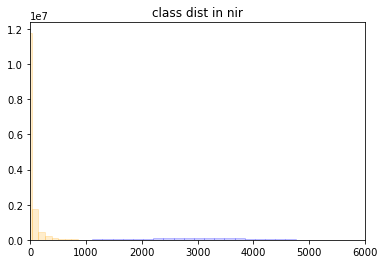

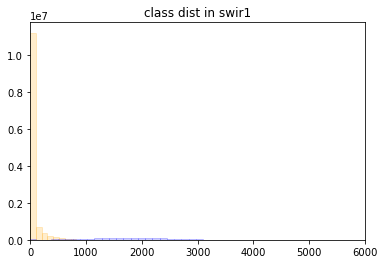

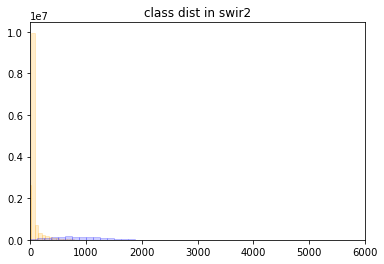

In [65]:
n_bins = 50
i = 0
for t, f in zip(x_t, x_f):
    fig, ax = plt.subplots()
    ax.set_title(f"class dist in {[j for j in T1_img][i]}")
    ax.hist(t, bins=n_bins, color='orange', edgecolor='orange',alpha=0.2);
    ax.hist(f, bins=n_bins, color='blue', edgecolor='blue',alpha=0.2)
    ax.set_xlim(0, 6000)
    i+=1

In [66]:
from sklearn.decomposition import PCA

In [67]:
pca = PCA(n_components=2)

In [68]:
pca.fit(x_t)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [69]:
print(pca.singular_values_)
print(pca.explained_variance_ratio_)

[894890.24291828 530511.53544308]
[0.70945966 0.24933189]


In [70]:
x_t_tpca = pca.fit_transform(np.transpose(x_t))
x_f_tpca = pca.transform(np.transpose(x_f))

x_f_fpca = pca.fit_transform(np.transpose(x_f))
x_t_fpca = pca.transform(np.transpose(x_t))

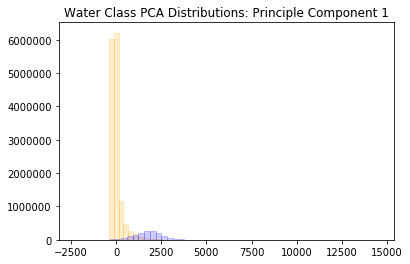

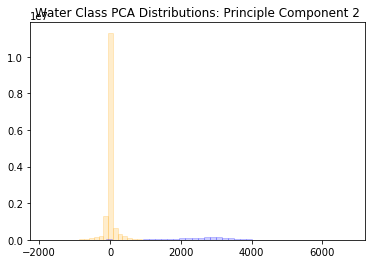

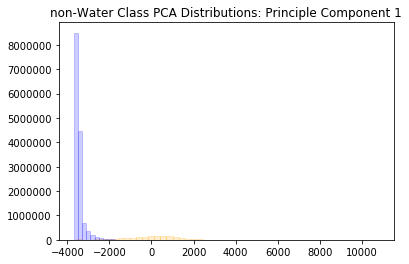

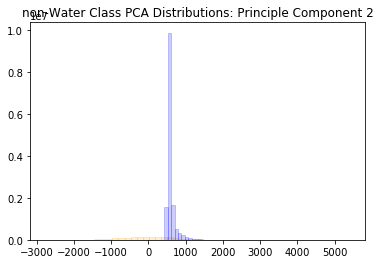

In [71]:
for i, p in enumerate(['Principle Component 1','Principle Component 2']):
    fig, ax = plt.subplots()
    ax.set_title(f'Water Class PCA Distributions: {p}')
    ax.hist(x_t_tpca[:,i], bins=n_bins, color='orange', edgecolor='orange',alpha=0.2);
    ax.hist(x_f_tpca[:,i], bins=n_bins, color='blue', edgecolor='blue',alpha=0.2);

for i, p in enumerate(['Principle Component 1','Principle Component 2']):
    fig, ax = plt.subplots()
    ax.set_title(f'non-Water Class PCA Distributions: {p}')
    ax.hist(x_f_fpca[:,i], bins=n_bins, color='orange', edgecolor='orange',alpha=0.2);
    ax.hist(x_t_fpca[:,i], bins=n_bins, color='blue', edgecolor='blue',alpha=0.2);

TBD

# **(5) Training of T1 using T0 labels**

define **model params**

In [73]:
# Create the model with 100 trees
model = RandomForestClassifier(n_estimators=10, 
                               bootstrap = True,
                               max_features = 'sqrt',
                               max_depth=2,
                               verbose=2
                              )

**fit model**

In [74]:
%%time
rf = model.fit(Xtrain, Ytrain)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 10


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   17.5s remaining:    0.0s


building tree 2 of 10
building tree 3 of 10
building tree 4 of 10
building tree 5 of 10
building tree 6 of 10
building tree 7 of 10
building tree 8 of 10
building tree 9 of 10
building tree 10 of 10
CPU times: user 2min 53s, sys: 8.94 s, total: 3min 2s
Wall time: 3min 2s


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  3.0min finished


**score model on training set** - should be replaced with cross-validation

In [75]:
rf_score = rf.score(Xtrain, Ytrain)
rf_score

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   10.5s finished


0.9946460644819303

extract & plot **variable importances**

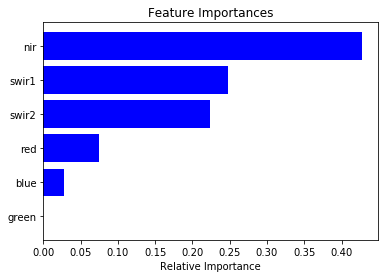

In [76]:
importances = rf.feature_importances_

indices = np.argsort(importances)
features = [i for i in T1_img]
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

extract and **plot decision tree** - TBC

# **(6) Validate against full T1 image & mask**

In [77]:
rf_val_res = rf.predict(Xval)
rf_val_probs = rf.predict_proba(Xval)[:, 1]

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   10.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   10.4s finished


In [78]:
rf_val_score = rf.score(Xval, Yval)
f"{round(rf_val_score, 4)*100} %"

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   10.5s finished


'82.89 %'

# **(6) Implement on full T1 image**

In [82]:
predicted = rf.predict(Ximp)
predicted = np.array(predicted)
probability = rf.predict_proba(Ximp)[:, 1]
probability = np.array(probability)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   41.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   40.3s finished


make dataset again

In [83]:
predicted[foundnans[:,0]] = np.nan
probability[foundnans[:,0]] = np.nan

In [84]:
predicted = np.reshape(predicted, [lenx, leny])
probability = np.reshape(probability, [lenx, leny])

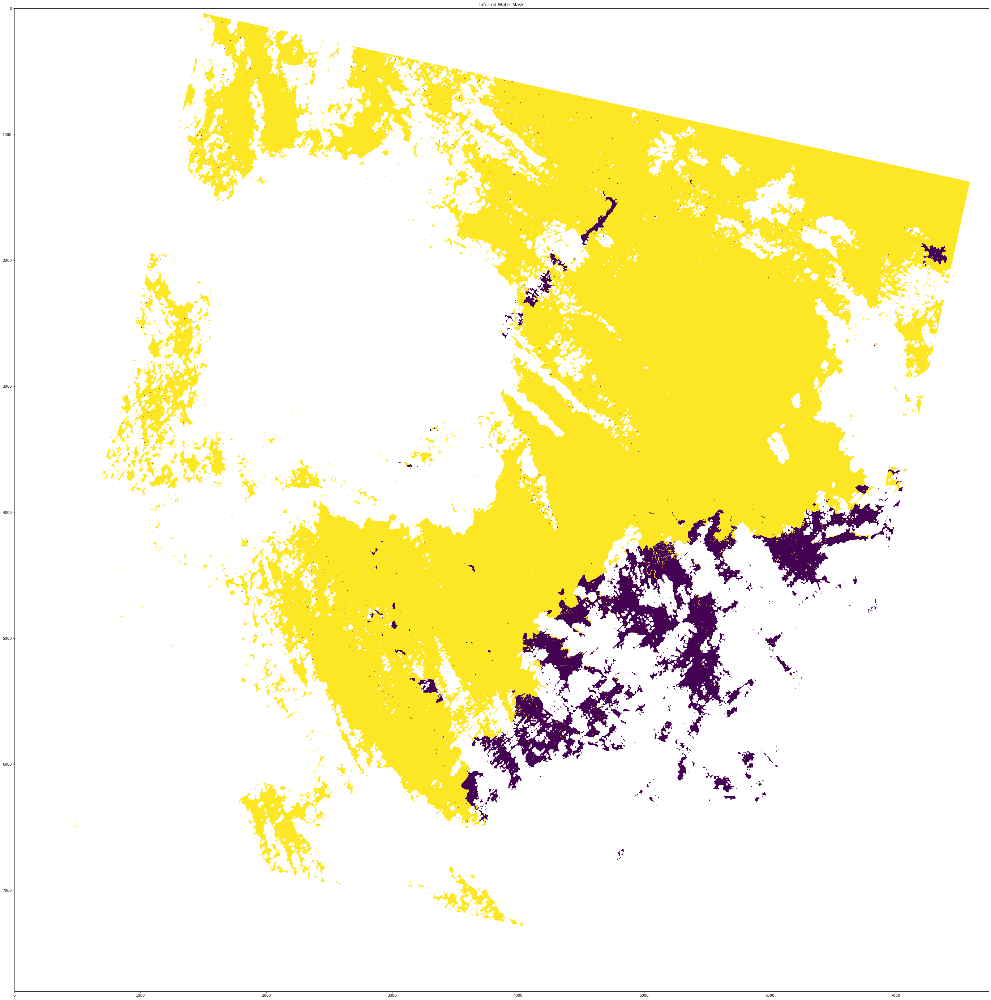

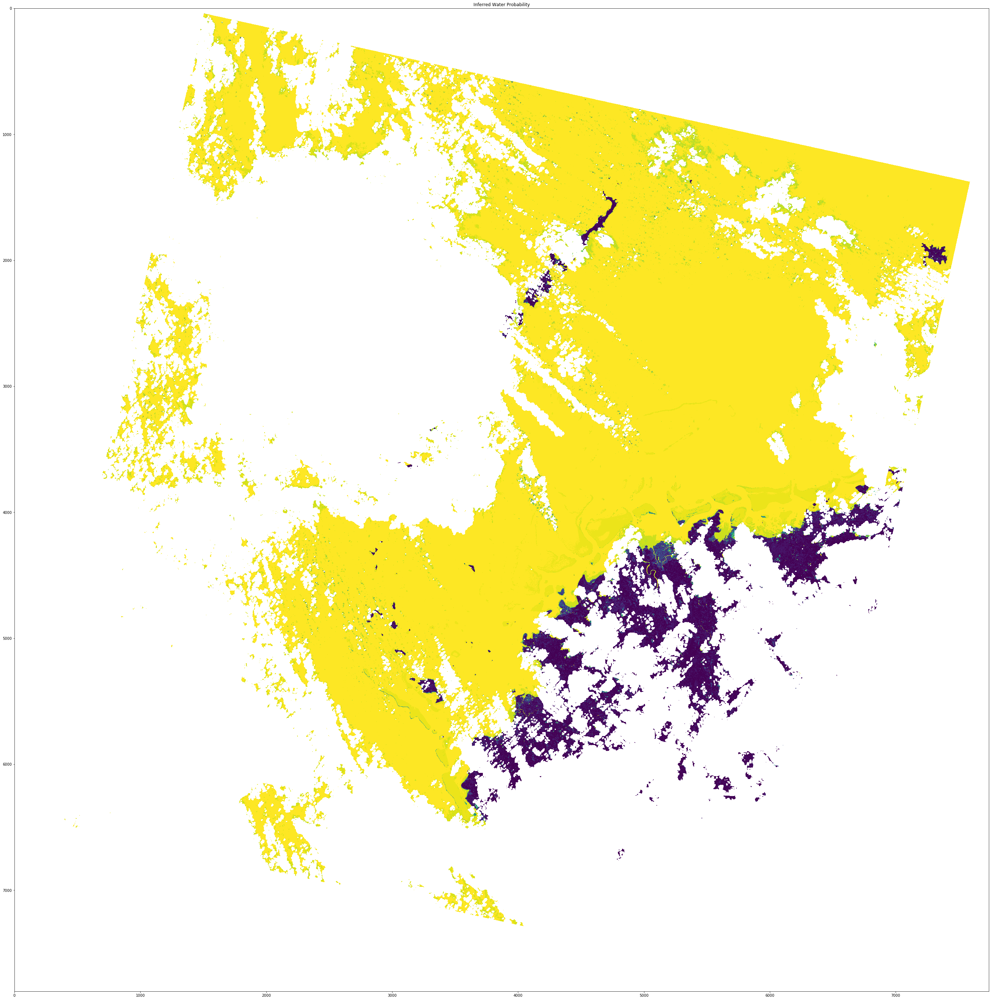

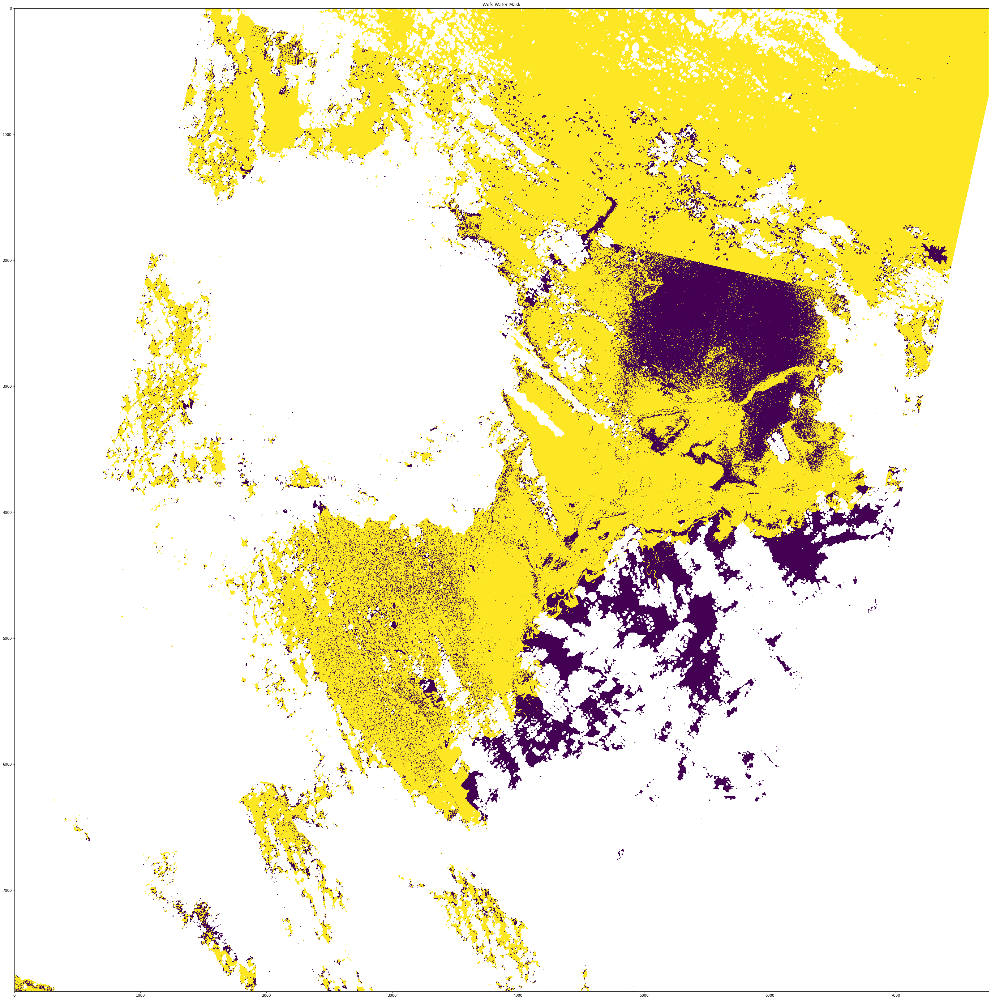

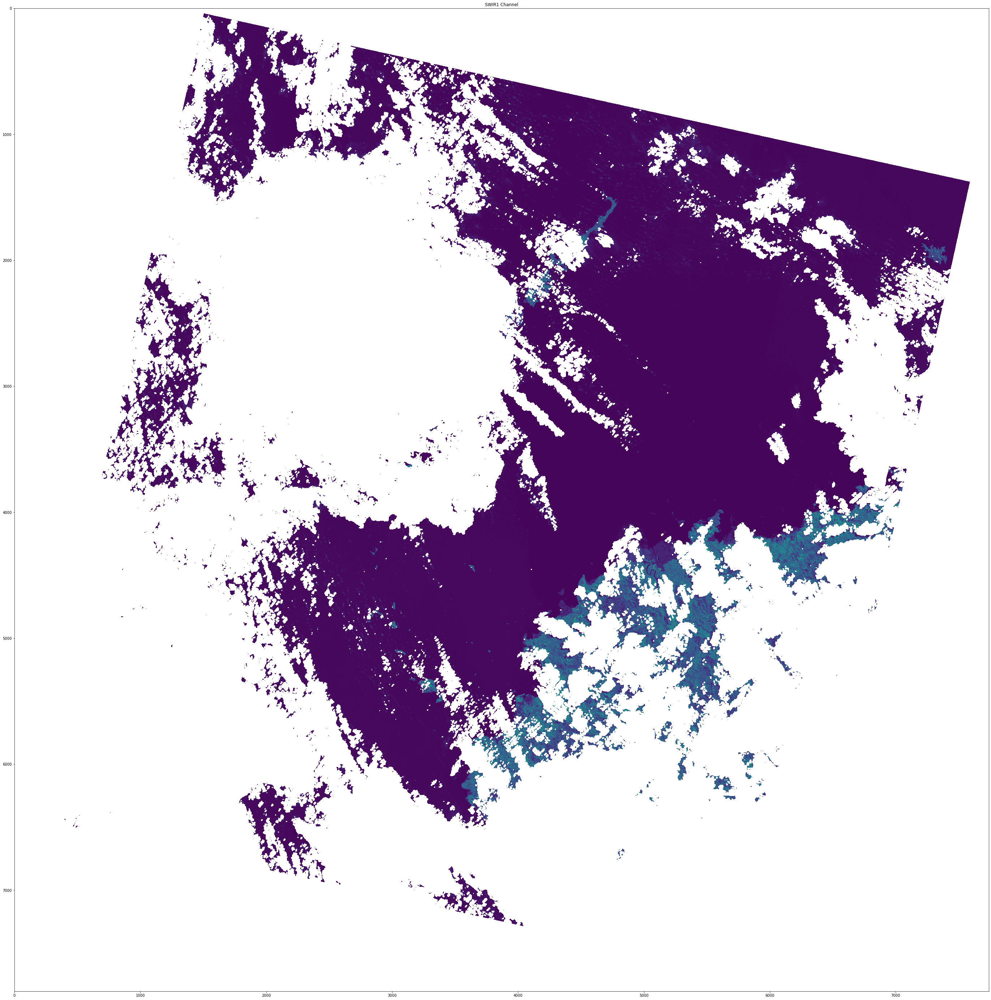

In [86]:
ds = landsat_dataset
ds['water_mask'] = (('y','x'), predicted)
ds['water_prob'] = (('y','x'), probability)

fig, ax = plt.subplots(figsize=(50,50))
# ds.water_mask.plot(ax=ax);
ax.imshow(ds.water_mask)
ax.set_title('Inferred Water Mask')
fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(ds.water_prob)
# ds.water_prob.plot(ax=ax);
ax.set_title('Inferred Water Probability')
fig, ax = plt.subplots(figsize=(50,50))
# T1_water.plot(ax=ax);
ax.imshow(T1_water)
ax.set_title('Wofs Water Mask')
fig, ax = plt.subplots(figsize=(50,50))
# ds.swir1.where(ds.red>0).plot(ax=ax);
ax.imshow(T1_img.swir1)
ax.set_title('SWIR1 Channel');

# **(7) Export(s)**

In [89]:
from utils_dcal.data_cube_utilities.import_export import export_xarray_to_geotiff

In [90]:
export_xarray_to_geotiff(ds, 'test.tif', bands=['water_mask', 'water_prob'], crs="EPSG:3460", x_coord='x', y_coord='y')

In [91]:
export_xarray_to_geotiff(ds, 'test_img.tif', bands=['blue', 'green', 'red'], crs="EPSG:3460", x_coord='x', y_coord='y')

CPLE_FileIOError: Free disk space available is 569450496 bytes, whereas 1449485280 are at least necessary. You can disable this check by defining the CHECK_DISK_FREE_SPACE configuration option to FALSE.